In [1]:
import sys # for automation and parallelisation
manual, scenario = (True, 'base') if 'ipykernel' in sys.argv[0] else (False, sys.argv[1])
if manual:
    %matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from quetzal.model import stepmodel

In [3]:
input_path = '../input/'
model_path = '../model/' + 'base' + '/'

In [4]:
# Load raw POIs
num_pois = pd.read_csv(input_path + 'spatial_num_pois_raw.csv', index_col='index')
#name_pois = pd.read_csv(input_path + 'spatial_name_pois_raw.csv', index_col='index')

In [5]:
num_pois.columns

Index(['amenity college', 'amenity school', 'amenity university',
       'building school', 'building university', 'craft',
       'amenity kindergarten', 'building retail', 'amenity marketplace',
       'shop bakery', 'shop beverages', 'shop butcher', 'shop convenience',
       'shop greengrocer', 'shop department_store', 'shop mall',
       'shop supermarket', 'shop clothes', 'shop shoes', 'shop garden_centre',
       'shop doityourself', 'shop hardware', 'amenity clinic',
       'amenity doctors', 'amenity pharmacy', 'amenity post_office',
       'building hospital', 'amenity bar', 'amenity biergarten',
       'amenity cafe', 'amenity pub', 'amenity arts_centre', 'amenity cinema',
       'amenity community_centre', 'amenity events_venue', 'amenity nightclub',
       'amenity theatre', 'amenity public_bath', 'leisure beach_resort',
       'leisure marina', 'leisure nature_reserve', 'leisure park',
       'leisure sports_centre', 'leisure stadium', 'leisure swimming_pool',
       'lei

In [6]:
len(num_pois.columns)

55

In [7]:
# How many zones with comparably few POIs (no zone has 0)?
len(num_pois.loc[num_pois.sum(axis=1)<10])

226

<Axes: >

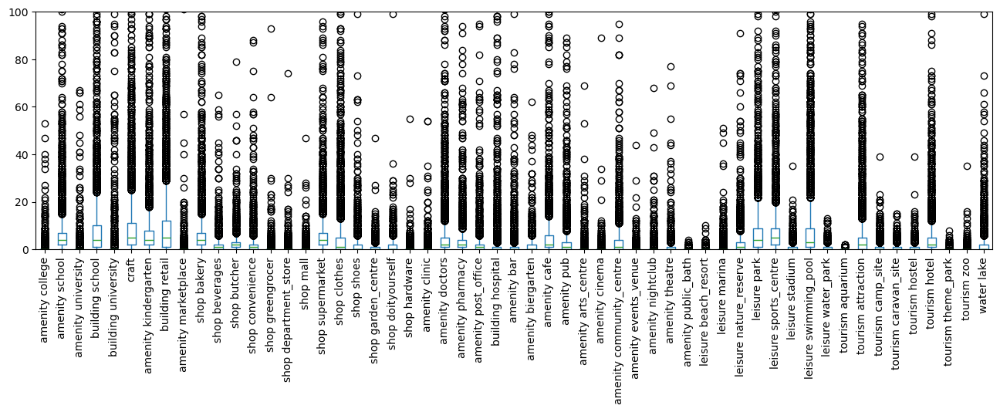

In [8]:
# Average POI numbers
num_pois.plot.box(figsize=(16,4), rot=90, ylim=(0,100))

<Axes: >

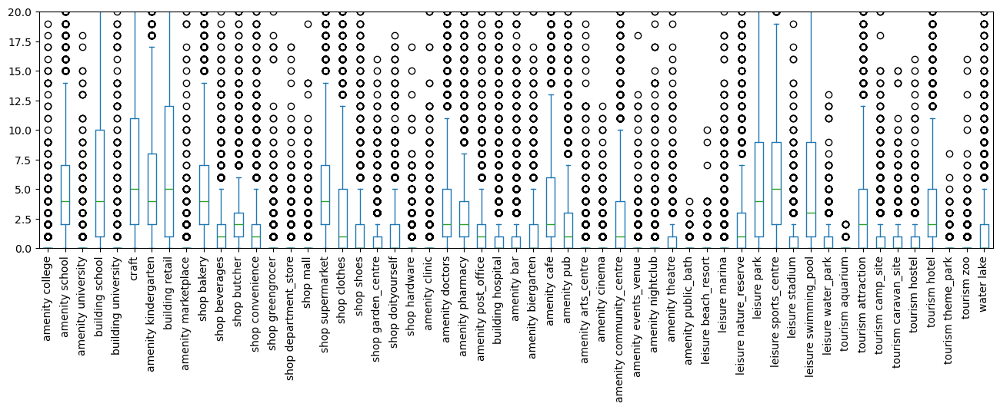

In [9]:
# ZOOM Average POI numbers
num_pois.plot.box(figsize=(16,4), rot=90, ylim=(0,20))

In [10]:
# Load zone attributes and geometries
sm = stepmodel.read_json(model_path + 'de_zones')
sm.zones = gpd.GeoDataFrame(sm.zones)

In [11]:
sm.zones[list(num_pois.columns)] = num_pois[list(num_pois.columns)]

Average POIs by urbanisation degree (1=urban, 3=rural)


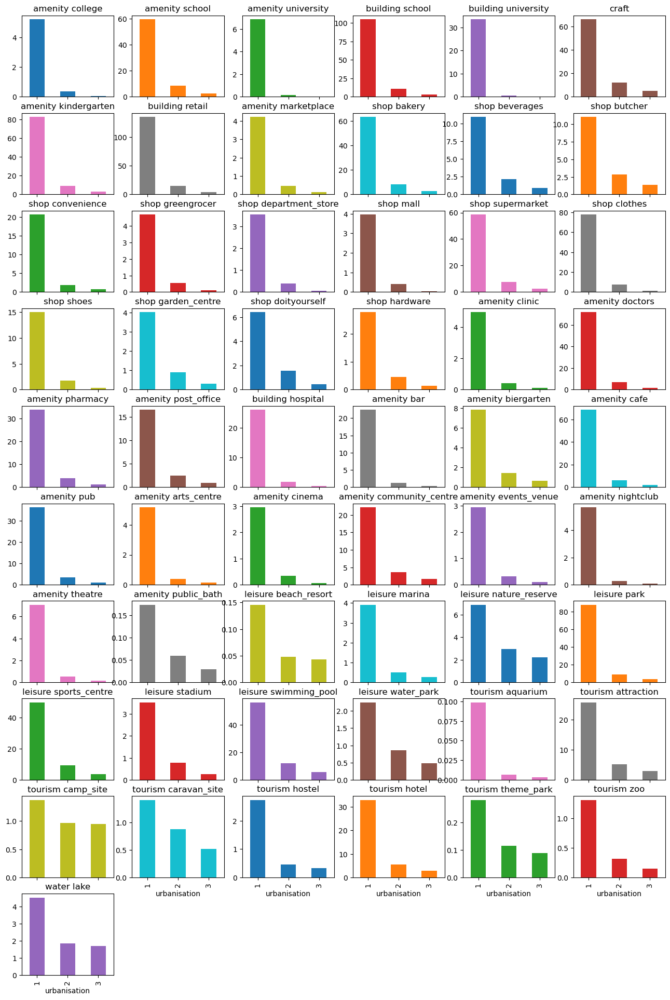

In [13]:
sm.zones.groupby('urbanisation')[list(num_pois.columns)].mean().plot.bar(
    subplots=True, figsize=(16,24), layout=(10,6), legend=False)
print('Average POIs by urbanisation degree (1=urban, 3=rural)')

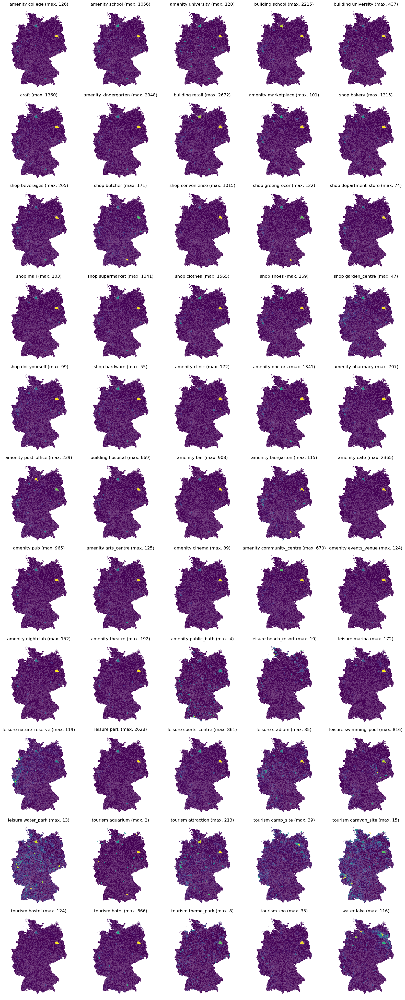

In [14]:
# Show maps
nrows = 11
ncols = 5
fig, ax = plt.subplots(nrows, ncols, figsize=(16,39), sharex='all', sharey='all', constrained_layout=True)
col_num = 0
for i in range(nrows):
    for j in range(ncols):
        col = list(num_pois.columns)[col_num]
        sm.zones.plot(column=col, ax=ax[i,j], legend=False)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(col + ' (max. {})'.format(sm.zones[col].max()))
        col_num = min(len(num_pois.columns)-1, col_num+1)

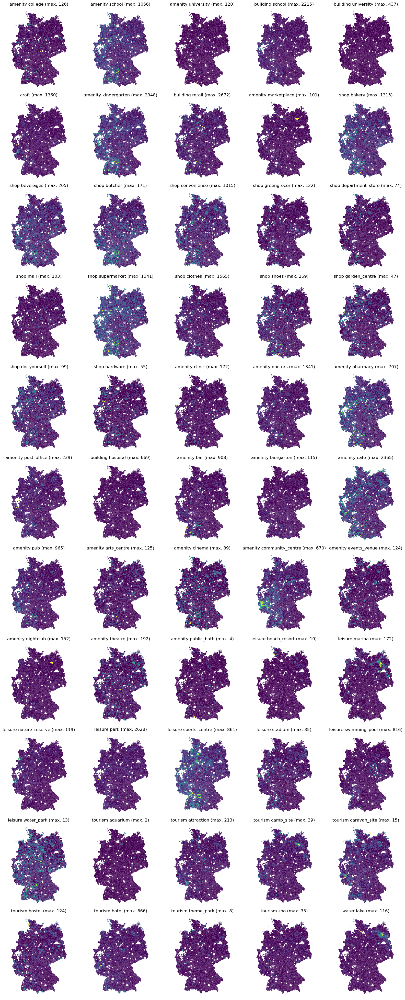

In [15]:
# Show maps, without urban
nrows = 11
ncols = 5
fig, ax = plt.subplots(nrows, ncols, figsize=(16,39), sharex='all', sharey='all', constrained_layout=True)
col_num = 0
for i in range(nrows):
    for j in range(ncols):
        col = list(num_pois.columns)[col_num]
        sm.zones.loc[sm.zones['urbanisation']!=1].plot(column=col, ax=ax[i,j],
                                                       legend=False, missing_kwds={'color': 'lightgrey'})
        ax[i,j].set_axis_off()
        ax[i,j].set_title(col + ' (max. {})'.format(sm.zones[col].max()))
        col_num = min(len(num_pois.columns)-1, col_num+1)

In [16]:
# Load POI codes and purpose classifications
poi_codes = pd.read_excel(input_path + 'spatial_OSM_POI_list.xlsx')
# Fill empty purpose cells
poi_codes['purpose model'].interpolate('pad', inplace=True)
# Build POI names
poi_codes['poi'] = poi_codes['key'].fillna('None')
poi_codes.loc[poi_codes['value'].notna(), 'poi'] += ' ' + poi_codes.loc[poi_codes['value'].notna(), 'value']

C:\Users\m.arnz\AppData\Local\Temp\ipykernel_24260\3002902582.py:4: FutureWarning: Series.interpolate with method=pad is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  poi_codes['purpose model'].interpolate('pad', inplace=True)


In [17]:
# Aggregate by travel purpose
# Always differentiate in categories of many POIs and few POIs
num_pois['education_many'] = num_pois['craft'] + \
                             num_pois[['amenity school', 'building school']].max(axis=1) + \
                             num_pois['amenity kindergarten']
num_pois['education_few'] = num_pois['amenity college'] + \
                            num_pois[['amenity university', 'building university']].max(axis=1)
num_pois['shopping_many'] = num_pois[list(poi_codes.loc[(poi_codes['purpose model']=='shopping') &
                                                        (poi_codes['weight']!='large'),
                                                        'poi'])].sum(axis=1)
num_pois['shopping_few'] = num_pois[list(poi_codes.loc[(poi_codes['purpose model']=='shopping') &
                                                       (poi_codes['weight']=='large'),
                                                       'poi'])].sum(axis=1)
num_pois['leisure_many'] = num_pois[list(poi_codes.loc[(poi_codes['purpose model']=='leisure') &
                                                       (poi_codes['weight']!='large'),
                                                       'poi'])].sum(axis=1)
num_pois['leisure_few'] = num_pois[list(poi_codes.loc[(poi_codes['purpose model']=='leisure') &
                                                      (poi_codes['weight']=='large'),
                                                      'poi'])].sum(axis=1)
num_pois['accompany'] = num_pois[list(poi_codes.loc[(poi_codes['purpose model']=='accompany'),
                                                    'poi'])].sum(axis=1)

<Axes: >

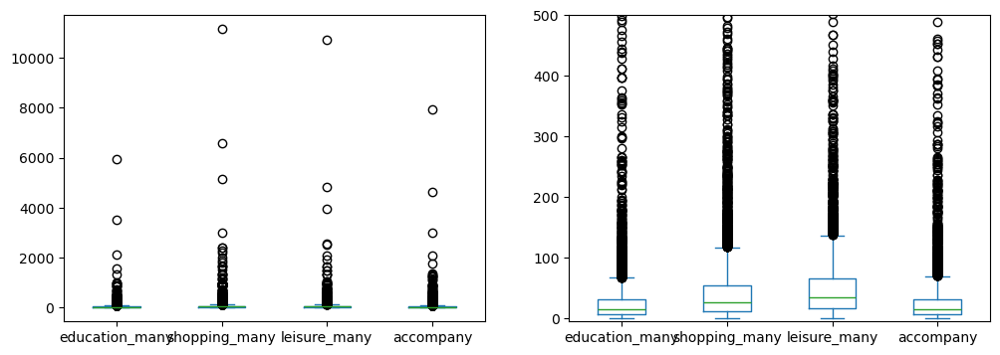

In [18]:
# purpose distribution for small-weighted POIs
fig, ax = plt.subplots(1,2, figsize=(12,4))
num_pois[['education_many', 'shopping_many', 'leisure_many', 'accompany']].plot.box(ax=ax[0])
num_pois[['education_many', 'shopping_many', 'leisure_many', 'accompany']].plot.box(ax=ax[1], ylim=(-5,500))

<Axes: >

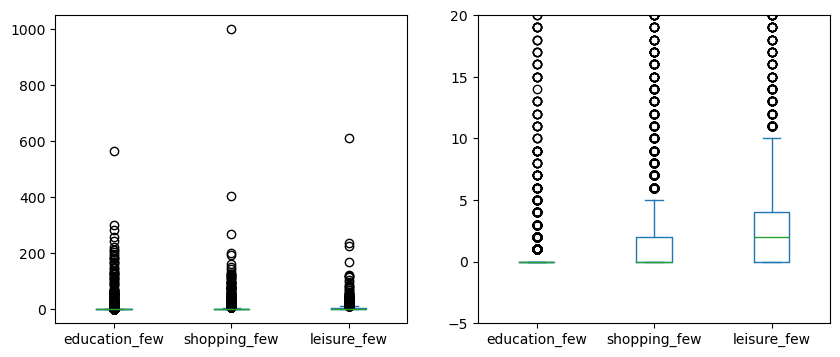

In [19]:
# purpose distribution for large-weighted POIs
fig, ax = plt.subplots(1,2, figsize=(10,4))
num_pois[['education_few', 'shopping_few', 'leisure_few']].plot.box(ax=ax[0])
num_pois[['education_few', 'shopping_few', 'leisure_few']].plot.box(ax=ax[1], ylim=(-5,20))

In [20]:
p_cols = ['education_many', 'education_few', 'shopping_many', 'shopping_few', 'leisure_many', 'leisure_few', 'accompany']
sm.zones[p_cols] = num_pois[p_cols]

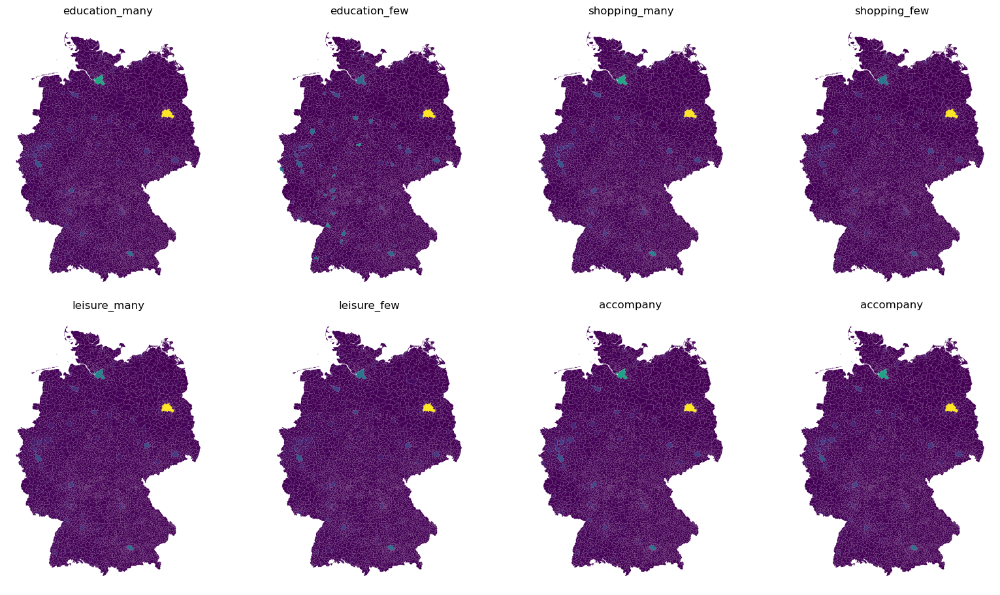

In [21]:
# Show maps of purposes
nrows = 2
ncols = 4
fig, ax = plt.subplots(nrows, ncols, figsize=(16,9), sharex='all', sharey='all', constrained_layout=True)
col_num = 0
for i in range(nrows):
    for j in range(ncols):
        col = p_cols[col_num]
        sm.zones.plot(column=col, ax=ax[i,j], legend=False)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(col)
        col_num = min(len(p_cols)-1, col_num+1)

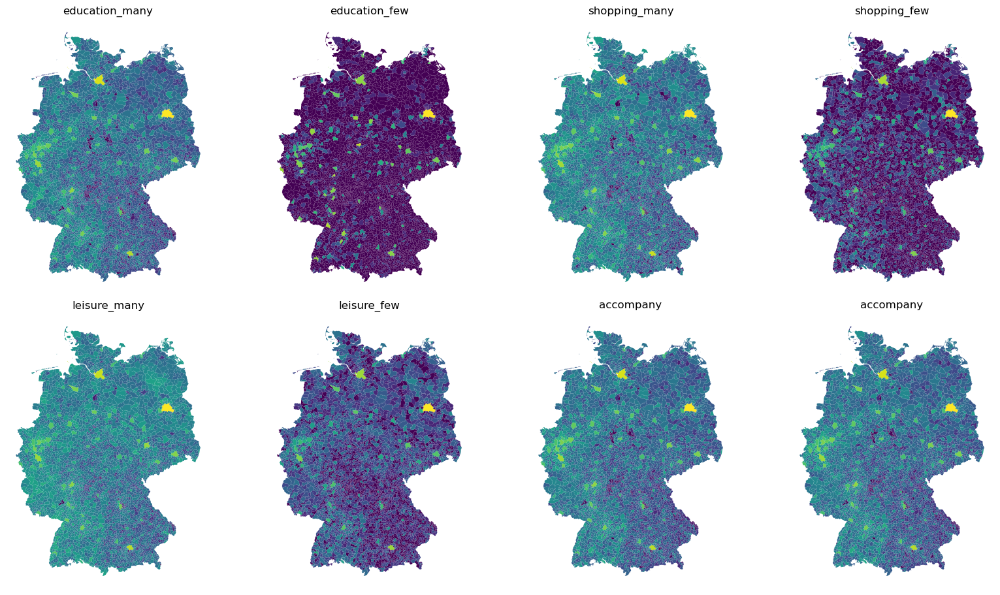

In [22]:
# Show maps of purposes with logarithm
nrows = 2
ncols = 4
fig, ax = plt.subplots(nrows, ncols, figsize=(16,9), sharex='all', sharey='all', constrained_layout=True)
col_num = 0
for i in range(nrows):
    for j in range(ncols):
        col = p_cols[col_num]
        sm.zones[col+'_log'] = (sm.zones[col] + 1).apply(np.log)
        sm.zones.plot(column=col+'_log', ax=ax[i,j], legend=False)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(col)
        col_num = min(len(p_cols)-1, col_num+1)

<Axes: >

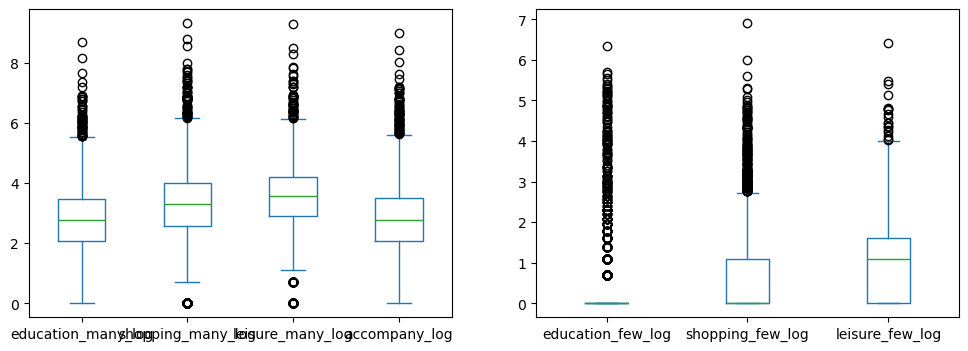

In [23]:
# purpose distribution for logarithm
fig, ax = plt.subplots(1,2, figsize=(12,4))
sm.zones[['education_many_log', 'shopping_many_log', 'leisure_many_log', 'accompany_log']].plot.box(ax=ax[0])
sm.zones[['education_few_log', 'shopping_few_log', 'leisure_few_log']].plot.box(ax=ax[1])

C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\colors.py:1371: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\lib\site-packages\matplotlib\co

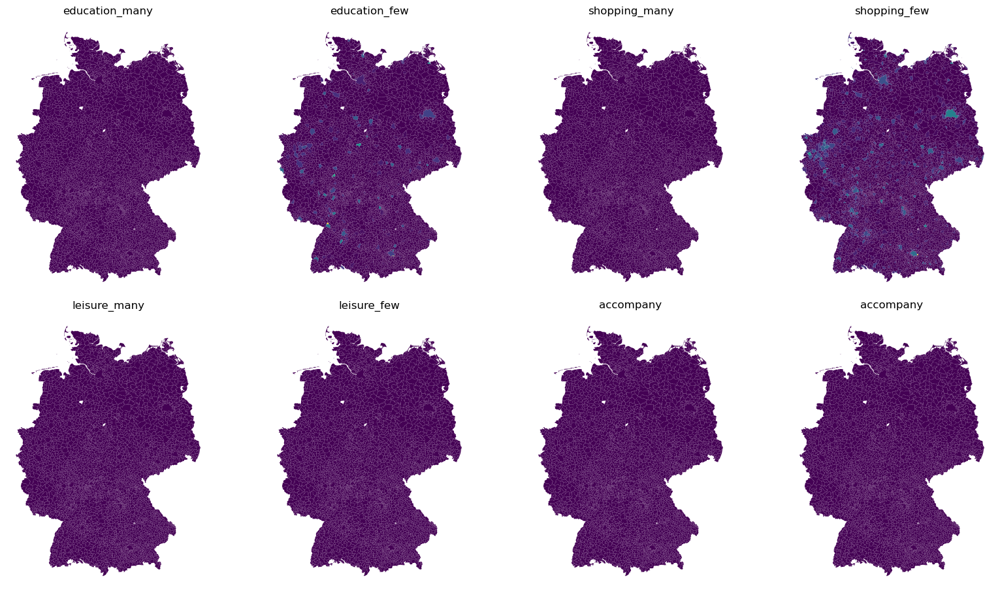

In [24]:
# Show maps of purposes with logarithm weighted with zone's area
nrows = 2
ncols = 4
fig, ax = plt.subplots(nrows, ncols, figsize=(16,9), sharex='all', sharey='all', constrained_layout=True)
col_num = 0
for i in range(nrows):
    for j in range(ncols):
        col = p_cols[col_num]
        sm.zones[col+'_area'] = (sm.zones[col] / sm.zones['area'] +1).apply(np.log)
        sm.zones.plot(column=col+'_area', ax=ax[i,j], legend=False)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(col)
        col_num = min(len(p_cols)-1, col_num+1)

In [25]:
# Save
num_pois[p_cols].to_csv(input_path + 'spatial_num_pois.csv')